In [2]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.datasets import load_breast_cancer
from sklearn.preprocessing import StandardScaler
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [3]:
cancer= pd.DataFrame(load_breast_cancer().data,columns = load_breast_cancer().feature_names)

In [24]:
load_breast_cancer()

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

# Analisis Exploratorio

In [4]:
cancer.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
cancer.shape

(569, 30)

In [6]:
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [7]:
cancer.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
# Visualización de componentes principales en pares
sns.pairplot(cancer, diag_kind='kde')  # 'diag_kind' permite mostrar histogramas de densidad en la diagonal principal
plt.show()

## Estandarizar variables


In [9]:
X = StandardScaler(with_std=True,with_mean=True).fit_transform(cancer)
pd.DataFrame(X,columns = load_breast_cancer().feature_names).head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


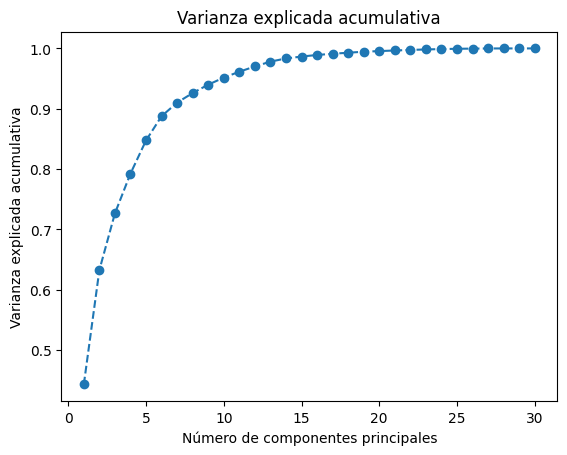

In [10]:
# Crear una instancia de PCA
pca = PCA()

# Aplicar PCA a tus datos estandarizados
principal_components = pca.fit_transform(X)

# Explorar la varianza explicada por cada componente principal
explained_variance_ratio = pca.explained_variance_ratio_

# Visualizar la varianza explicada acumulativa para decidir cuántos componentes conservar
import matplotlib.pyplot as plt

plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio.cumsum(), marker='o', linestyle='--')
plt.title('Varianza explicada acumulativa')
plt.xlabel('Número de componentes principales')
plt.ylabel('Varianza explicada acumulativa')
plt.show()

In [36]:
explained_variance_ratio[:10].sum()

0.9515688143366666

In [63]:
n_components = 10
pca = PCA(n_components=n_components)
principal_components = pca.fit_transform(X)

# Ahora tienes tus datos reducidos a n_components características
pc_df=pd.DataFrame(principal_components, columns=[f'PC{i}' for i in range(1, n_components + 1)])

In [64]:
pca.explained_variance_ratio_[0:9].sum()

0.9398790324415761

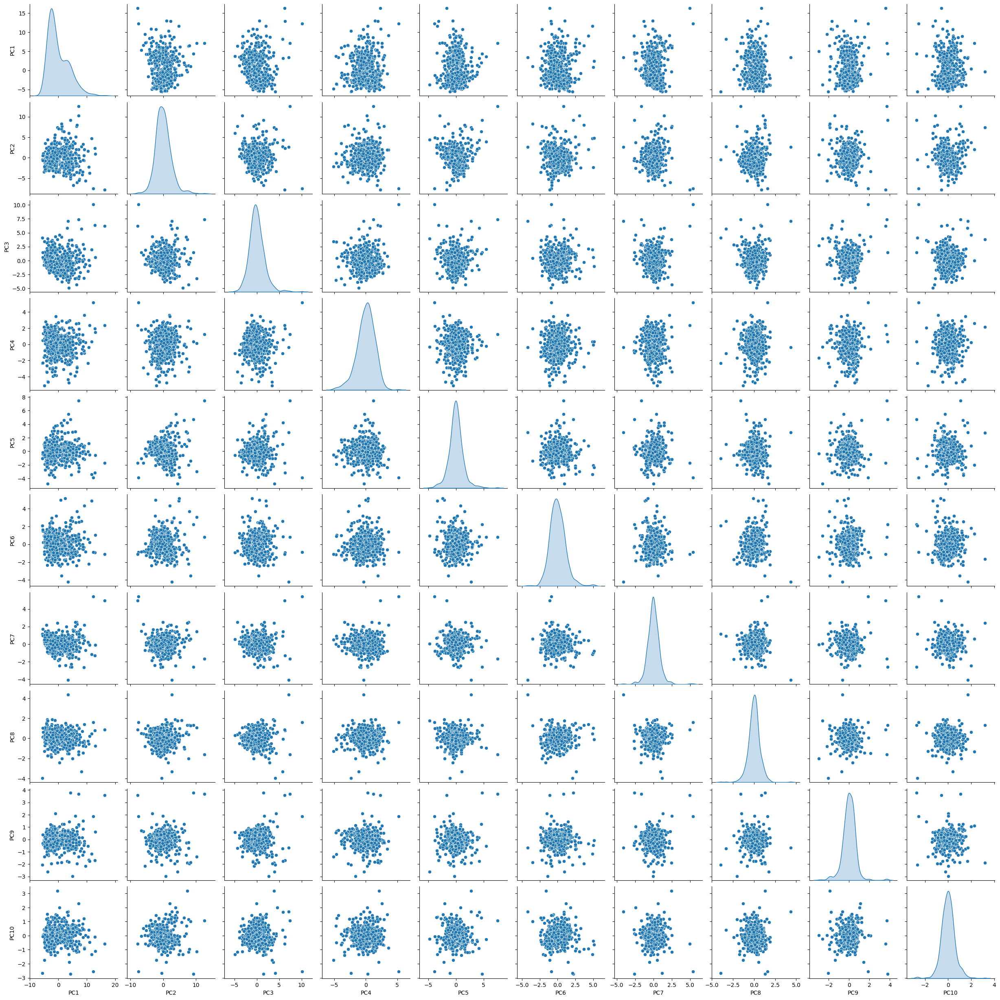

In [65]:
# Visualización de componentes principales en pares
sns.pairplot(pc_df, diag_kind='kde')  # 'diag_kind' permite mostrar histogramas de densidad en la diagonal principal
plt.show()

# Importancia de las variables en cada componente
La elección del número de variables que debemos retener de los componentes principales depende de los objetivos de análisis y de la cantidad de información que estés dispuesto a perder en el proceso de reducción de dimensionalidad.


In [66]:
import pandas as pd

# Crear un DataFrame con las cargas de cada variable en cada componente principal
loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i}' for i in range(1, n_components + 1)], index=cancer.columns)

#Importancia de las variables
loadings_abs = loadings.abs()

# Mostrar las 5 variables con las cargas más altas para cada componente principal
top_loadings = loadings_abs.apply(lambda x: x.nlargest(5).index)

# Mostrar las cargas
print("Cargas de variables en cada componente principal:")
print(top_loadings)

Cargas de variables en cada componente principal:
                    PC1                      PC2               PC3  \
0   mean concave points   mean fractal dimension     texture error   
1        mean concavity  fractal dimension error  smoothness error   
2  worst concave points  worst fractal dimension    symmetry error   
3      mean compactness              mean radius    worst symmetry   
4       worst perimeter        compactness error      radius error   

               PC4                PC5               PC6  \
0    worst texture    mean smoothness    worst symmetry   
1     mean texture    concavity error    symmetry error   
2    texture error   worst smoothness  worst smoothness   
3  mean smoothness      mean symmetry     mean symmetry   
4       area error  compactness error  smoothness error   

                       PC7               PC8                   PC9  \
0  worst fractal dimension  smoothness error       concavity error   
1     concave points error     tex

###  Crear gráficos de barras para las variables más correlacionadas con cada componente principal
Las cargas son los coeficientes que indican la correlación o la contribución de cada variable original a un componente principal.

- Cargas cercanas a 0: Las variables con cargas cercanas a 0 tienen una contribución mínima al componente principal correspondiente y, por lo tanto, tienen poco impacto en la estructura del componente. Puedes considerar eliminar o no darles mucha importancia si deseas simplificar la interpretación del componente.

- Cargas cercanas a 0.6: Las variables con cargas cercanas a 0.6 tienen una contribución significativa al componente principal. Esto significa que estas variables tienen un fuerte impacto en la formación del componente y son importantes para entender la estructura de los datos en ese componente.

- Cargas intermedias: Las cargas que se encuentran entre 0 y 0.6 indican una contribución moderada de la variable al componente principal. Estas variables son relevantes pero pueden no ser tan dominantes como las que tienen cargas más altas. La interpretación de estas cargas dependerá de tu objetivo de análisis y de cómo deseas utilizar los componentes principales.

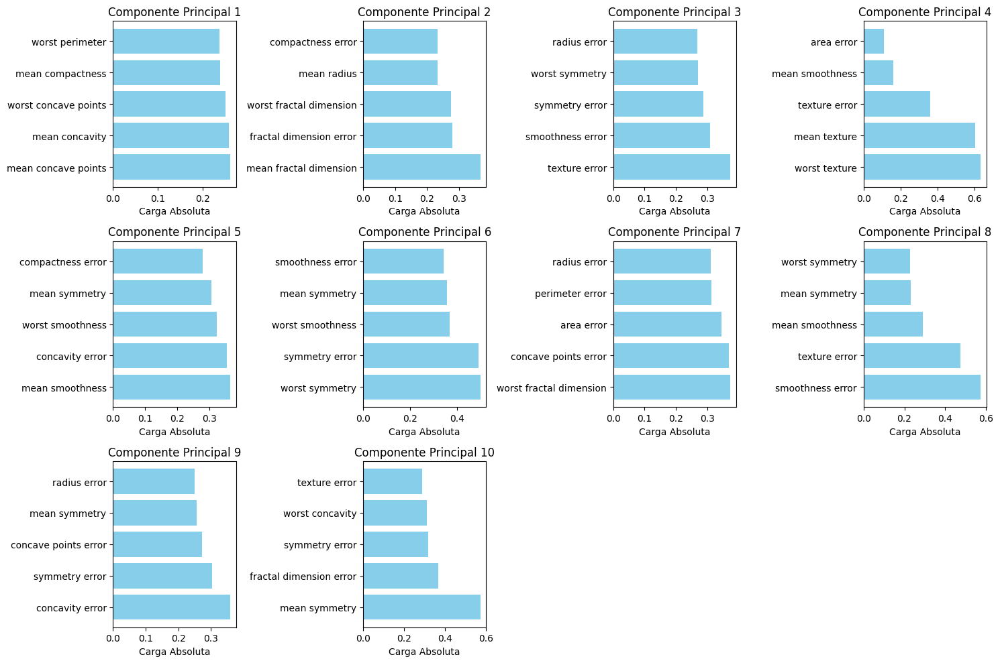

In [67]:
plt.figure(figsize=(15, 10))

for i in range(n_components):
    plt.subplot(3, 4, i + 1) #grafico de 3 filas y 3 columnas para visualizar cada componente
    top_vars = top_loadings[f'PC{i+1}'] #muestra los variables con mayor importancia para cada componente
    loading_values = loadings_abs[f'PC{i+1}'][top_vars]
    plt.barh(top_vars, loading_values, color='skyblue')
    plt.xlabel('Carga Absoluta')
    plt.title(f'Componente Principal {i+1}')

plt.tight_layout()
plt.show()


##### Nombre de componentes

Componente Principal 1 (PC1): "Características de Contorno y Dimensiones"

Componente Principal 2 (PC2): "Propiedades de Superficie y Textura"

Componente Principal 3 (PC3): "Errores de Medición y Simetría"

Componente Principal 4 (PC4): "Características de Composición y Suavidad"

Componente Principal 5 (PC5): "Errores de Textura y Simetría"

Componente Principal 6 (PC6): "Propiedades de Suavidad y Dimensión Fractal"

Componente Principal 7 (PC7): "Características de Dimensión Fractal y Puntos de Contorno"



In [68]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()

In [69]:
cancer_type= load_breast_cancer().target

In [70]:
X_train, X_test, y_train, y_test = train_test_split(pc_df, cancer_type, train_size = 0.7, random_state=1234)

In [71]:
model.fit(X_train,y_train)

GaussianNB()

In [72]:
labels = model.predict(X_test)

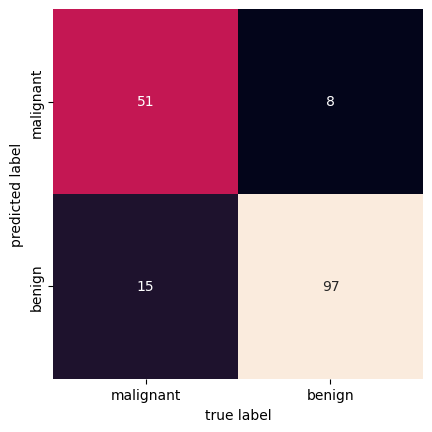

In [73]:
from sklearn.metrics import confusion_matrix
mat = confusion_matrix(y_test, labels)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False,
            xticklabels=load_breast_cancer().target_names, yticklabels=load_breast_cancer().target_names)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [74]:
from sklearn.metrics import precision_score, recall_score,f1_score,accuracy_score

In [75]:
print(f'precision: {precision_score(labels,y_test)}')
print(f'recall: {recall_score(labels,y_test)}')
print(f'accuracy: {accuracy_score(labels,y_test)}')
print(f'f1 score: {f1_score(labels,y_test)}')


precision: 0.9238095238095239
recall: 0.8660714285714286
accuracy: 0.8654970760233918
f1 score: 0.8940092165898618
